<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [2]:
!pip install seaborn ydata_profiling ipywidgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 398.7/398.7 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 34.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 1.5 MB/s eta 0:00:00


In [70]:
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet, Ridge
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error as MSE
from ydata_profiling import ProfileReport
from phik.report import plot_correlation_matrix
from phik import phik_matrix

random.seed(42)
np.random.seed(42)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

`Your answer here`

Сиды нужны для воспроизводимости рандомных чисел: т.е., например, если мы один раз случайно разделили данные на train и test, если мы не применим сид, то каждый запуск кода будет давать разные результаты (и, соответственно, мы получим нестабильную оценку модели). В случае же фиксации сида при повторном запуске (например, при запуске моего дз куратором) аутпут будет тем же, что облегчает проверку.

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [4]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

**Ваш ответ здесь.**

In [ ]:
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0


In [5]:
# проверим пропуски
missing_count = df_train.isnull().sum()
print("Пропуски в train-датасете")
print(missing_count)
print(f"Всего: {sum(missing_count)}")

Пропуски в train-датасете
name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64
Всего: 1005


In [6]:
missing_count = df_test.isnull().sum()
print("Пропуски в test-датасете")
print(missing_count)
print(f"Всего: {sum(missing_count)}")

Пропуски в test-датасете
name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64
Всего: 95


In [7]:
# названия колонок, для которых есть пропущенные значения
missing_cols = df_train.columns[df_train.isnull().any()].tolist()
print("Колонки с пропущенными значениями (train):", missing_cols)

missing_cols = df_train.columns[df_test.isnull().any()].tolist()
print("Колонки с пропущенными значениями (test):", missing_cols)

Колонки с пропущенными значениями (train): ['mileage', 'engine', 'max_power', 'torque', 'seats']
Колонки с пропущенными значениями (test): ['mileage', 'engine', 'max_power', 'torque', 'seats']


In [9]:
# проверим дубликаты
duplicate_rows = df_train.duplicated().sum()
print("Кол-во дубликатов в train:", duplicate_rows)

duplicate_rows = df_test.duplicated().sum()
print("Кол-во дубликатов в test:", duplicate_rows)

Кол-во дубликатов в train: 985
Кол-во дубликатов в test: 62


Посчитаем, какой процент данных приходится на дубликаты:

In [10]:
print(f"Процент дубликатов в train-датасете: {round((df_train.duplicated().sum() / df_train.shape[0]) * 100, 2)}%")
print(f"Процент дубликатов в test-датасете: {round((df_test.duplicated().sum() / df_test.shape[0]) * 100, 2) }%")

Процент дубликатов в train-датасете: 14.07%
Процент дубликатов в test-датасете: 6.2%


In [ ]:
profile = ProfileReport(df_train, title="Cars Train Data EDA", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 19.07it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile = ProfileReport(df_test, title="Cars Test Data EDA", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 38.04it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df_test.shape

(1000, 13)

In [ ]:
df_train.shape

(6999, 13)

Дубликаты в датасетах есть, но их процент в train-датасете (14.07% по моим подсчетам и 7% в дашборде - в дашборде считаются уникальные дублирующиеся строки) и test-датасете (6.2% и 3.3%) не особо велик.

Пропусков в процентном соотношении немного (1.1% и 0.7% для train- и test-датасетов соответственно), однако в абсолютных числах этих значений много: 1005 из 6999 из 95 из 1000 соответственно. Пропуски распределены неравномерно и касаются только технических характеристик автомобиля (mileage, engine, max_power, torque, seats) (здесь либо продавцы не полностью заполняют информацию об автомобилях, либо, возможно, данные неверно парсятся).

Признаки year и km_driven демонстрируют сильную взаимосвязь, что вполне логично (старые автомобили имеют больший пробег).

В целом датасет информативный, но необходимо провести очистку от дублей и корректное заполнение пропусков.

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Посчитайте основные статистики по числовым столбцам для трейна и теста:**

In [11]:
# Ваш код здесь

# числовые признаки
numeric_cols = df_train.select_dtypes(include=[np.number]).columns
print(numeric_cols)

print("Статистики числовых столбцов для train")
display(df_train[numeric_cols].describe().T)

print("Статистики числовых столбцов для test")
display(df_test[numeric_cols].describe().T)

Index(['year', 'selling_price', 'km_driven', 'seats'], dtype='object')
Статистики числовых столбцов для train


,count,mean,std,min,25%,50%,75%,max
year,6999.0,2013.818403,4.053095,1983.0,2011.0,2015.0,2017.0,2020.0
selling_price,6999.0,639515.197171,808941.911915,29999.0,254999.0,450000.0,675000.0,10000000.0
km_driven,6999.0,69584.615517,57724.001817,1.0,35000.0,60000.0,97000.0,2360457.0
seats,6797.0,5.419008,0.965767,2.0,5.0,5.0,5.0,14.0


Статистики числовых столбцов для test


,count,mean,std,min,25%,50%,75%,max
year,1000.0,2013.681000,4.012149,1995.0,2011.0,2014.0,2017.0,2020.0
selling_price,1000.0,617901.042000,758553.860710,31000.0,250000.0,434999.0,670000.0,6000000.0
km_driven,1000.0,71393.341000,48486.218662,1303.0,37000.0,61500.0,100000.0,375000.0
seats,981.0,5.410805,0.919985,4.0,5.0,5.0,5.0,9.0


**Посчитайте основные статистики по категориальным столбцам для трейна и теста:**

In [12]:
# категориальные признаки
cat_cols = df_train.select_dtypes(include=['object']).columns
print(cat_cols)

print("Статистики категориальных столбцов для train")
display(df_train[cat_cols].describe().T)

print("Статистики категориальных столбцов для test")
display(df_test[cat_cols].describe().T)

Index(['name', 'fuel', 'seller_type', 'transmission', 'owner', 'mileage',
       'engine', 'max_power', 'torque'],
      dtype='object')
Статистики категориальных столбцов для train


,count,unique,top,freq
name,6999,1924,Maruti Swift Dzire VDI,116
fuel,6999,4,Diesel,3793
seller_type,6999,3,Individual,5826
transmission,6999,2,Manual,6095
owner,6999,5,First Owner,4587
mileage,6797,386,18.9 kmpl,197
engine,6797,120,1248 CC,885
max_power,6803,316,74 bhp,330
torque,6796,419,190Nm@ 2000rpm,468


Статистики категориальных столбцов для test


,count,unique,top,freq
name,1000,621,Maruti Alto 800 LXI,15
fuel,1000,4,Diesel,534
seller_type,1000,3,Individual,837
transmission,1000,2,Manual,877
owner,1000,5,First Owner,623
mileage,981,237,18.6 kmpl,23
engine,981,88,1248 CC,116
max_power,981,182,74 bhp,43
torque,981,226,200Nm@ 1750rpm,57


**Сравните среднее и медиану внутри train, внутри test и между собой. О чём могут говорить результаты?**

In [13]:
compare = pd.DataFrame({
    'train_mean': df_train[numeric_cols].mean(),
    'test_mean': df_test[numeric_cols].mean(),
    'train_median': df_train[numeric_cols].median(),
    'test_median': df_test[numeric_cols].median()
})

compare['mean_diff'] = compare['train_mean'] - compare['test_mean']
compare['median_diff'] = compare['train_median'] - compare['test_median']
compare.head()

,train_mean,test_mean,train_median,test_median,mean_diff,median_diff
year,2013.818403,2013.681000,2015.0,2014.0,0.137403,1.0
selling_price,639515.197171,617901.042000,450000.0,434999.0,21614.155171,15001.0
km_driven,69584.615517,71393.341000,60000.0,61500.0,-1808.725483,-1500.0
seats,5.419008,5.410805,5.0,5.0,0.008203,0.0


In [ ]:
df_train["seats"].unique()

array([ 5.,  4., nan,  7.,  8.,  6.,  9., 10., 14.,  2.])

Для числовых признаков распределения в целом симметричные и не содержат сильных выбросов. Изменения между train и test наиболее заметны в столбцах selling_price и km_driven, где средние и медианы отличаются на несколько десятков тысяч. Это нормально, тк вполне естественно, что в выборках содержатся разные по стоимости и по пробегу автомобили. Менее выражены изменения в year и seats, где разница mean и median минимальна: число мест в автомобилях, как правило, ограничено, поэтому разброс теоретически не может быть большим, а отсутствие значимой разницы по параметру "год выпуска" говорит, скорее всего, об отсутствии редких старых машин.

**Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.**

Анализ статистик показывает, что числовые признаки year и seats почти не отличаются между train и test по среднему и медиане. В то же время selling_price и km_driven демонстрируют более заметные различия: средняя цена в train выше, а средний пробег в test немного выше, что может говорить о том, что в train выборка включает более дорогие автомобили, а в test — автомобили с большим пробегом.

Среди категориальных признаков распределение типов топлива, трансмиссии и владельцев достаточно однородное, хотя уникальные модели (name) сильно различаются между train и test, что отражает разнообразие марок и моделей в разных подвыборках. Пропуски в числовых технических характеристиках (mileage, engine, max_power, torque, seats) незначительные, но их стоит учитывать при обработке данных. В целом, распределения признаков стабильны.

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

**Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)**

In [14]:
# выбросим целевую переменную
X_train = df_train.drop(columns=["selling_price"])
duplicate_count = X_train.duplicated().sum()

print("Количество объектов с одинаковым признаковым описанием:", duplicate_count)

Количество объектов с одинаковым признаковым описанием: 1159


**Отобразите такие объекты (0.01 балла)**

In [15]:
duplicates = df_train[X_train.duplicated(keep=False)].sort_values(list(X_train.columns))
print("Объекты-дубликаты:")
duplicates.head()

Объекты-дубликаты:


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
1703,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
6307,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
1836,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
6704,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
117,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0


**Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)**

In [16]:
df_train = df_train.drop_duplicates(subset=X_train.columns, keep='first')

**Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)**

In [17]:
df_train = df_train.reset_index(drop=True)

**Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)**

Да, скрытые дубли могут быть в данных в случае, когда данные идентичны, но формы записи различны (например, когда один и тот же автомобиль записан по-разному или когда в числовых столбцах выбраны разные единицы измерения).

Чтобы выловить скрытые дубли, можно нормализовать данные (привести данные к одному регистру, удалить лишние пробелы, преобразовать технические хар-ки, также можно выделить марку авто в отдельный столбец). Также можно сравнить строки по метрикам близости (например, по расстоянию Левенштейна) и в случае сходства, близкого к единице, удалять подобные дубликаты.

In [18]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [19]:
# your code here

cols = ["mileage", "engine", "max_power", "torque"]

df_train[cols].head(8)

,mileage,engine,max_power,torque
0,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
1,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm
2,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm
3,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)"
4,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm
5,17.3 km/kg,1061 CC,57.5 bhp,"7.8@ 4,500(kgm@ rpm)"
6,16.1 kmpl,796 CC,37 bhp,59Nm@ 2500rpm
7,23.59 kmpl,1364 CC,67.1 bhp,170Nm@ 1800-2400rpm


Подумаем, как обработать столбец torque. Какие случаи встречаются:
- 190Nm@ 2000rpm: здесь парсим на 190 (torque) и 2000 (rpm)
- 250Nm@ 1500-2500rpm: парсим на 250 (torque) и 1500-2500 (rpm)
- 22.4 kgm at 1750-2750rpm: переводим 22.4 из kgm в Nm (torque) и 1750 (rpm) (здесь можем оставить промежуток, но в большинстве строк лишь одно число, поэтому можем взять min или max из промежутка)
- 11.5@ 4,500(kgm@ rpm): предположим, что @ - это kgm (тк значения в Nm обычно больше, судя по датафрейму), тогда парсим как 11.5 × 9.80665 = 112.8 Nm и 4500 (rpm)
- 113.75nm@ 4000rpm: 113.75 (torque) и 4000 (rpm) (здесь nm@ в отличие от Nm@ из первого примера)

*p.s. гугл говорит, что 1 кгм = 9.80665 Нм*

In [20]:
KGM_TO_NM = 9.80665

def clean_numeric(value):
    """
    пункты 1-2: убирает единицы измерения и приводит строку к float
    """
    if pd.isna(value):
        return np.nan
    value = str(value)
    num = re.findall(r'\d+\.?\d*', value)
    return float(num[0]) if num else np.nan

def parse_torque(text):
    """
    пункт 3: обрабатываем признак torque и делим на два столбца
    """
    if pd.isna(text):
        return np.nan, np.nan

    text = text.strip().lower()

    # сначала столбец torque

    # случай 1 и 4: 250nm, 190Nm, 113,75nm
    nm_match = re.search(r'(\d+\.?\d*)\s*nm', text)

    # случай 2: 22.4 kgm
    kgm_match = re.search(r'(\d+\.?\d*)\s*kgm', text)

    # случай 3: 11.5@, предполагаем kgm
    at_match = re.search(r'^(\d+\.?\d*)\s*@', text)

    torque_nm = None

    if nm_match:
        torque_nm = float(nm_match.group(1))

    elif kgm_match:
        torque_nm = float(kgm_match.group(1)) * KGM_TO_NM

    elif at_match:
        torque_nm = float(at_match.group(1)) * KGM_TO_NM

    # потом столбец max_torque_rpm

    # ищем что-то вроде 2000rpm, 1500-2500rpm, 4,500rpm
    rpm_match = re.search(r'(\d[\d,]*)(?:\s*-\s*(\d[\d,]*))?\s*rpm', text)

    # если совпадений нет, пытаемся искать числа после "@"
    if not rpm_match:
        rpm_match = re.search(r'@?\s*(\d[\d,]*)', text)

    rpm = None
    if rpm_match:
        rpm1 = rpm_match.group(1).replace(",", "")
        rpm2 = rpm_match.group(2).replace(",", "") if rpm_match.lastindex == 2 else None

        try:
            rpm = int(rpm1)
            if rpm2:  # если встретили диапазон
                rpm2 = int(rpm2)
                rpm = max(rpm, rpm2)
        except:
            pass

    return torque_nm, rpm

In [21]:
cols_simple = ["mileage", "engine", "max_power"]

for df in [df_train, df_test]:

  for col in cols_simple:
      df[col] = df[col].apply(clean_numeric)

  df["torque_parsed"], df["max_torque_rpm"] = zip(*df['torque'].map(parse_torque))
  df["torque"] = df["torque_parsed"]
  df.drop(columns=["torque_parsed"], inplace=True)
  df["torque"] = df["torque"].astype(float)
  df["max_torque_rpm"] = df["max_torque_rpm"].astype(float)

In [ ]:
df_train.head(4)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.000000,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.000000,5.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.668960,5.0,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,112.776475,5.0,11.0


### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [22]:
# your code here

 # столбцы, в которых могут быть пропуски
num_cols = ["mileage", "engine", "max_power", "torque", "max_torque_rpm", "seats"]

median_values = df_train[num_cols].median()
df_train[num_cols] = df_train[num_cols].fillna(median_values)
df_test[num_cols] = df_test[num_cols].fillna(median_values)

print("Кол-во пропущенных значений в train", df_train[num_cols].isnull().sum())
print("Кол-во пропущенных значений в test", df_test[num_cols].isnull().sum())

Кол-во пропущенных значений в train mileage           0
engine            0
max_power         0
torque            0
max_torque_rpm    0
seats             0
dtype: int64
Кол-во пропущенных значений в test mileage           0
engine            0
max_power         0
torque            0
max_torque_rpm    0
seats             0
dtype: int64


**Почему стоит применять именно медиану?**

Стоит применять медиану, потому что она устойчива к выбросам и экстремальным значениям, которые часто встречаются в признаках вроде mileage, engine, max_power и torque. Среднее же сильно смещается в сторону аномальных значений (очень больших или очень маленьких), что может исказить заполнение пропусков.

**Как правильно считать медиану для заполнения?**

по тренировочным данным для train и test — то есть берём медиану только из train и используем её как для train, так и для test. При подготовке модели тестовый набор считается новыми данными, информация о которых заранее недоступна. Если использовать медиану, рассчитанную по тестовым данным, это приведёт к утечке данных, тк модель будет знать хар-ки тестового датасета заранее.

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [23]:
# your code here

for df in [df_train, df_test]:
    df["engine"] = df["engine"].astype(int)
    df["seats"] = df["seats"].astype(int)

In [24]:
df_train["seats"].unique()

array([ 5,  4,  7,  8,  6,  9, 10, 14,  2])

`Your answer here`

**Почему seats можно рассматривать как категориальную переменную:** хотя seats числовой признак, он принимает ограниченный набор значений (например, 5, 4, 7, 8, 6, 9, 10, 14, 2 мест). Для модели это скорее категории, чем количественная величина, потому что разница между 4 и 5 местами не обязательно линейно отражается в цене автомобиля.

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [25]:
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
year,5840.0,2013.428425,4.095622,1983.00000,2011.00,2014.00,2017.00000,2.020000e+03
selling_price,5840.0,522960.091096,535432.001912,29999.00000,250000.00,405000.00,640000.00000,1.000000e+07
km_driven,5840.0,73952.242466,60071.136504,1.00000,39000.00,70000.00,100000.00000,2.360457e+06
mileage,5840.0,19.430841,3.985973,0.00000,16.95,19.37,22.30000,4.200000e+01
engine,5840.0,1429.448973,485.662834,624.00000,1197.00,1248.00,1498.00000,3.604000e+03
max_power,5840.0,87.906371,31.640418,0.00000,68.00,81.86,99.00000,4.000000e+02
torque,5840.0,176.515966,127.850784,47.07192,111.80,160.00,200.05566,5.001391e+03
seats,5840.0,5.426712,0.982344,2.00000,5.00,5.00,5.00000,1.400000e+01
max_torque_rpm,5840.0,2861.774829,1113.301301,5.00000,2000.00,2800.00,4000.00000,5.300000e+03


In [26]:
df_test.describe().T

,count,mean,std,min,25%,50%,75%,max
year,1000.0,2013.681000,4.012149,1995.0,2011.00,2014.000,2017.0,2.020000e+03
selling_price,1000.0,617901.042000,758553.860710,31000.0,250000.00,434999.000,670000.0,6.000000e+06
km_driven,1000.0,71393.341000,48486.218662,1303.0,37000.00,61500.000,100000.0,3.750000e+05
mileage,1000.0,19.338810,3.951750,0.0,16.55,19.370,22.3,3.226000e+01
engine,1000.0,1454.876000,521.995740,624.0,1197.00,1248.000,1582.0,3.604000e+03
max_power,1000.0,90.841670,34.893389,34.2,69.00,82.425,102.0,2.800000e+02
torque,1000.0,178.090096,104.045842,48.0,111.70,160.000,206.0,1.421964e+03
seats,1000.0,5.403000,0.912921,4.0,5.00,5.000,5.0,9.000000e+00
max_torque_rpm,1000.0,2919.554000,1104.551731,7.0,2200.00,2800.000,4000.0,5.200000e+03


`Your answer here`

Судя по статистике df_train и df_test, заполнение пропусков медианой практически не повлияло на распределения. Средние и медианные значения (50% квантиль) близки к исходным, например, 61500 km_driven VS 60000 km_driven в исходном train-датасете.

Заполнение пропусков могло бы сдвинуть распределение, если бы мы использовали среднее вместо медианы. Также распределние могло бы сдвинуться, если бы пропуски стояли бы на месте больших значений и мы бы заменили эти большие значения на средние (тогда бы сдвиг был в сторону маленьких значений). То есть в случаях, когда реальное значение сильно отличается от медианного.

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

In [27]:
df_train.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage', 'engine', 'max_power', 'torque',
       'seats', 'max_torque_rpm'],
      dtype='object')

In [28]:
df_train.select_dtypes(include=[np.number]).columns

Index(['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power',
       'torque', 'seats', 'max_torque_rpm'],
      dtype='object')

**Шаг 1**

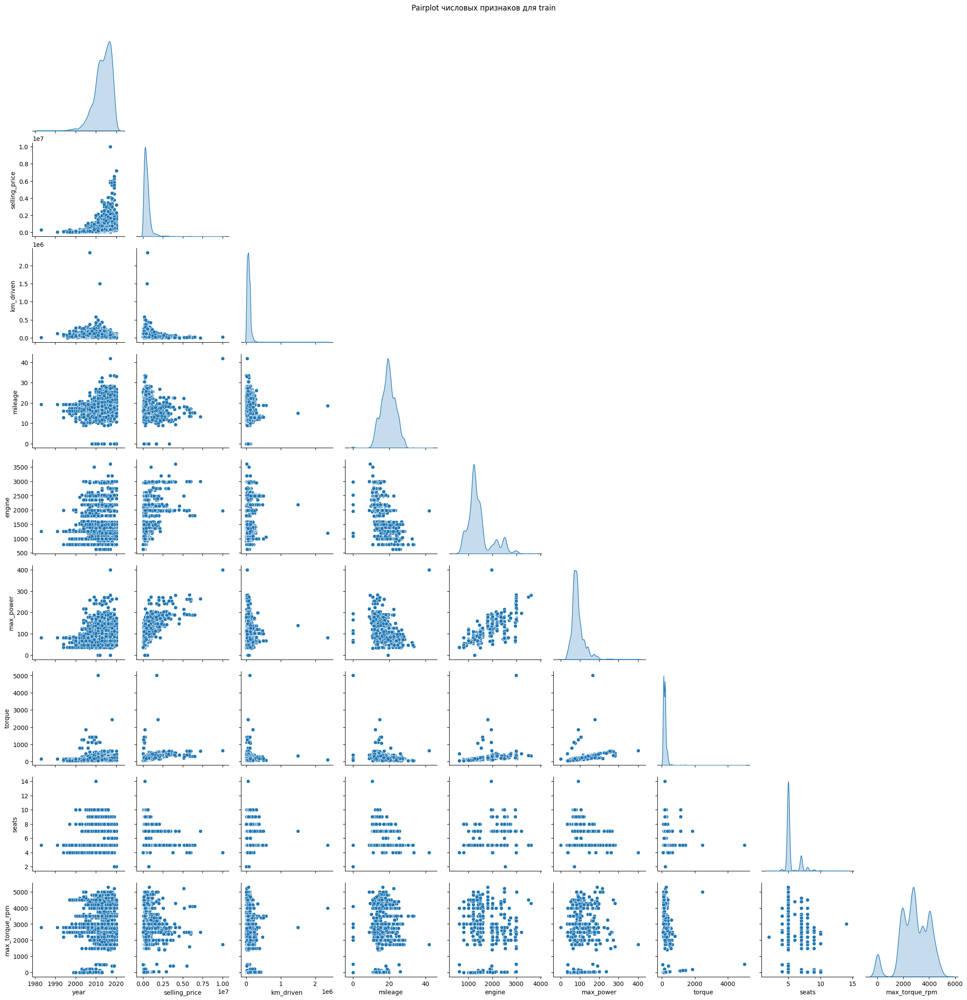

In [29]:
# your code here
numeric_features = df_train.select_dtypes(include=[np.number]).columns
sns.pairplot(df_train[numeric_features], diag_kind='kde', corner=True)
plt.suptitle("Pairplot числовых признаков для train", y=1.02)
plt.show()

*Можно ли предположить на основе распределений связь признаков с целевой переменной?*

Явная корреляция прослеживается между признаком year и целевой переменной selling_price (положительная зависимость), km_driven и selling_price (отрицательная зависимость - машины с большим пробегом имеют стоимость ниже), torque и selling_price.

*Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?*

Если говорить о корреляции признаков друг с другом, то сильная зависимость проявляется между engine и max_power, а также torque и max_power.

**Шаг 2**

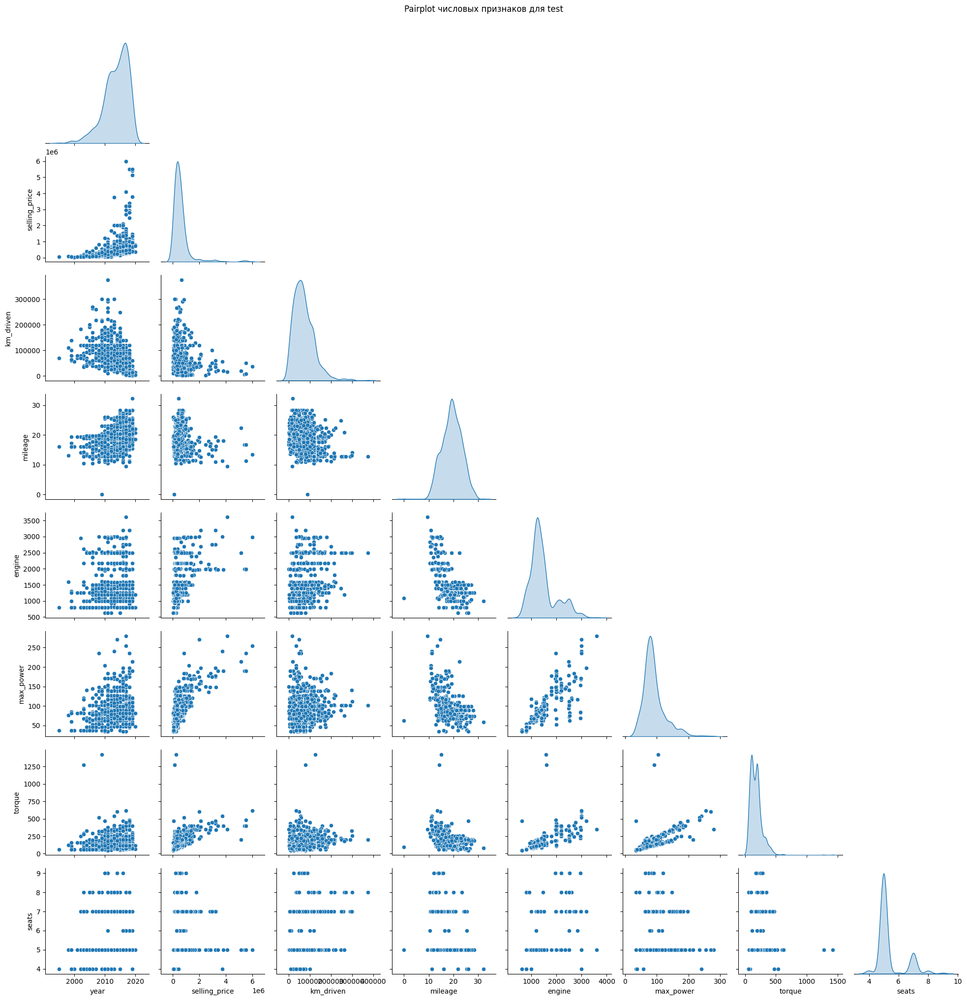

In [30]:
sns.pairplot(df_test[numeric_features[:-1]], diag_kind='kde', corner=True)
plt.suptitle("Pairplot числовых признаков для test", y=1.02)
plt.show()

*Похожими ли оказались совокупности при разделении на трейн и тест?*

Зависимость признаков и переменных сохраняется в test-датасете, корреляция признаков также идентичны.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

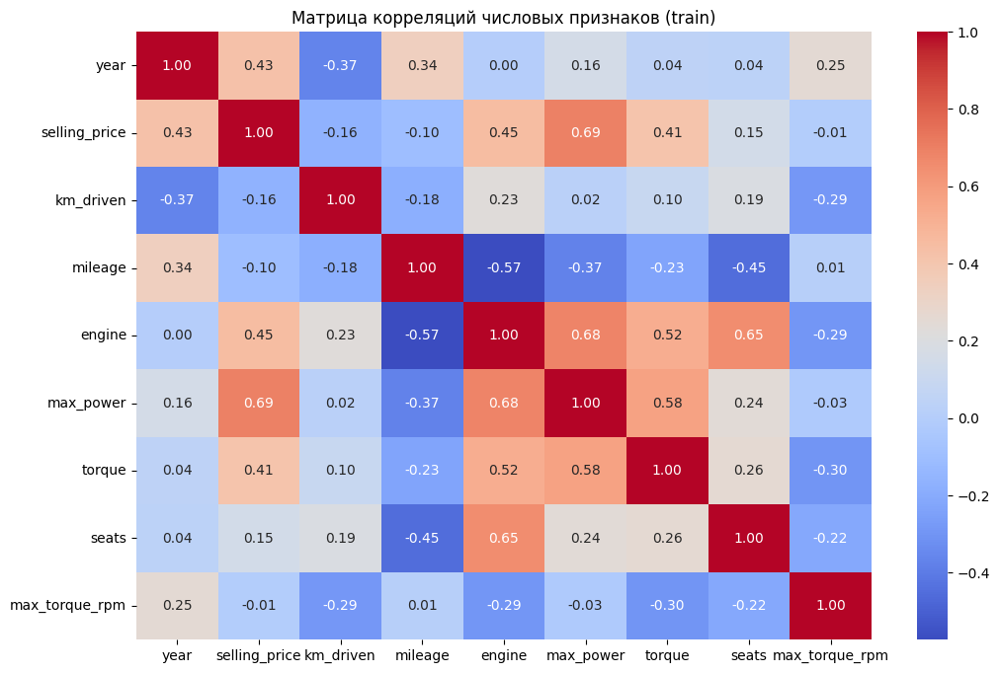

In [31]:
# your code here

numeric_features = df_train.select_dtypes(include=[np.number])
corr_matrix = numeric_features.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title("Матрица корреляций числовых признаков (train)")
plt.show()

In [32]:
corr_matrix

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.427279,-0.368966,0.341334,0.002819,0.156858,0.044546,0.041178,0.252426
selling_price,0.427279,1.000000,-0.164828,-0.104769,0.447672,0.692814,0.411298,0.149953,-0.006049
km_driven,-0.368966,-0.164828,1.000000,-0.182086,0.229766,0.024588,0.096053,0.192328,-0.285314
mileage,0.341334,-0.104769,-0.182086,1.000000,-0.572893,-0.373390,-0.230966,-0.451059,0.011634
engine,0.002819,0.447672,0.229766,-0.572893,1.000000,0.681117,0.523031,0.652172,-0.291320
max_power,0.156858,0.692814,0.024588,-0.373390,0.681117,1.000000,0.575469,0.244112,-0.025953
torque,0.044546,0.411298,0.096053,-0.230966,0.523031,0.575469,1.000000,0.260540,-0.298236
seats,0.041178,0.149953,0.192328,-0.451059,0.652172,0.244112,0.260540,1.000000,-0.216015
max_torque_rpm,0.252426,-0.006049,-0.285314,0.011634,-0.291320,-0.025953,-0.298236,-0.216015,1.000000


- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

`Your answer here`

Наименее скоррелированные признаки (смотрим на значения корреляций по модулю ближе к 0):
- year и engine (0.0028)
- year и seats (0.0412)

Сильная положительная линейная зависимость:
- engine и max_power (0.681)
- max_power и torque (0.575)
- engine и seats (0.652)

*Чем меньше год, тем больше км проехала машина?*
year и km_driven имеют зависимость -0.37

Это отрицательная корреляция: чем старше машина (меньше год), тем больше у неё пробег. Поэтому да, можно утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина.

In [33]:
pearson_corr = numeric_features.corr(method='pearson')
print("Корреляция Пирсона:")
print(pearson_corr)

spearman_corr = numeric_features.corr(method='spearman')
print("Корреляция Спирмена:")
print(spearman_corr)

kendall_corr = numeric_features.corr(method='kendall')
print("Корреляция Кендалла:")
print(kendall_corr)

Корреляция Пирсона:
                    year  selling_price  km_driven   mileage    engine  \
year            1.000000       0.427279  -0.368966  0.341334  0.002819   
selling_price   0.427279       1.000000  -0.164828 -0.104769  0.447672   
km_driven      -0.368966      -0.164828   1.000000 -0.182086  0.229766   
mileage         0.341334      -0.104769  -0.182086  1.000000 -0.572893   
engine          0.002819       0.447672   0.229766 -0.572893  1.000000   
max_power       0.156858       0.692814   0.024588 -0.373390  0.681117   
torque          0.044546       0.411298   0.096053 -0.230966  0.523031   
seats           0.041178       0.149953   0.192328 -0.451059  0.652172   
max_torque_rpm  0.252426      -0.006049  -0.285314  0.011634 -0.291320   

                max_power    torque     seats  max_torque_rpm  
year             0.156858  0.044546  0.041178        0.252426  
selling_price    0.692814  0.411298  0.149953       -0.006049  
km_driven        0.024588  0.096053  0.192328  

По умолчанию pd.corr() использует корреляцию Пирсона, эта корреляция оценивает линейную зависимость между числовыми признаками.

Всего я протестировала 3 типа корреляции:
- Pearson - чувствителен к выбросам, показывает более низкие или менее устойчивые значения при наличии экстремальных значений (km_driven, mileage).
- Spearman - ранговая, отражает монотонную зависимость; коэффициенты часто выше для признаков с нелинейной зависимостью (year и selling_price).
- Kendall - также ранговая, значения чуть ниже Spearman, более устойчива к выбросам.

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


Корреляция Спирмена:

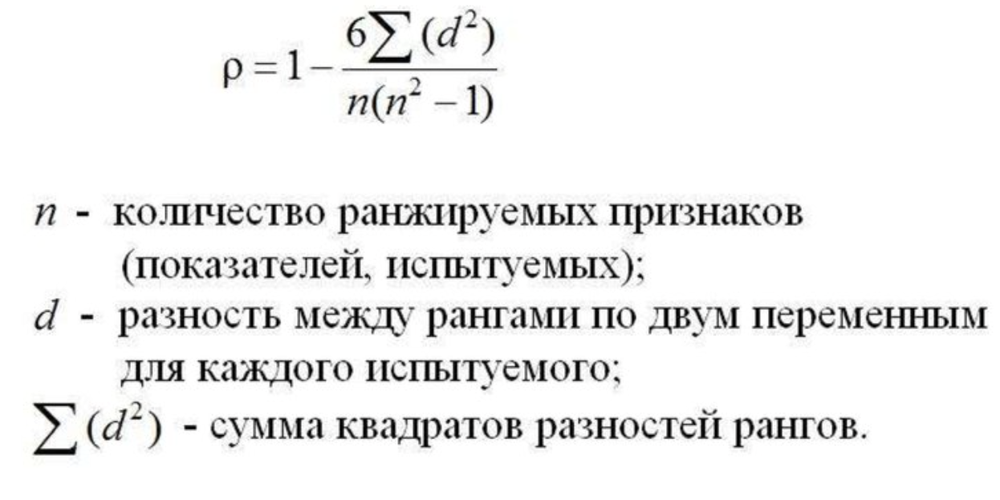

In [34]:
# your code here

def spearman(x, y):
    x_rank = np.argsort(np.argsort(x))
    y_rank = np.argsort(np.argsort(y))

    d = x_rank - y_rank
    n = len(x)

    rho = 1 - (6 * np.sum(d**2)) / (n * (n**2 - 1))
    return rho

cols = numeric_features.columns
n = len(cols)

spearman_matrix = pd.DataFrame(
    np.zeros((n, n)),
    index=cols,
    columns=cols
)

for c1 in cols:
    for c2 in cols:
        spearman_matrix.loc[c1, c2] = spearman(
            numeric_features[c1].values,
            numeric_features[c2].values
        )

In [ ]:
spearman_matrix

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.705083,-0.567031,0.344179,-0.038301,0.165631,0.102706,0.045115,0.202129
selling_price,0.705083,1.000000,-0.295273,0.026304,0.462233,0.611807,0.582308,0.224200,-0.034674
km_driven,-0.567031,-0.295273,1.000000,-0.198025,0.302698,0.039766,0.240643,0.108045,-0.375401
mileage,0.344179,0.026304,-0.198025,1.000000,-0.428647,-0.308642,-0.161085,-0.302795,-0.062824
engine,-0.038301,0.462233,0.302698,-0.428647,1.000000,0.711058,0.837709,0.354557,-0.401481
max_power,0.165631,0.611807,0.039766,-0.308642,0.711058,1.000000,0.779682,0.198034,-0.043432
torque,0.102706,0.582308,0.240643,-0.161085,0.837709,0.779682,1.000000,0.287797,-0.492025
seats,0.045115,0.224200,0.108045,-0.302795,0.354557,0.198034,0.287797,1.000000,-0.122701
max_torque_rpm,0.202129,-0.034674,-0.375401,-0.062824,-0.401481,-0.043432,-0.492025,-0.122701,1.000000


In [35]:
spearman_corr = numeric_features.corr(method='spearman')
print("Корреляция Спирмена:")
print(spearman_corr)

Корреляция Спирмена:
                    year  selling_price  km_driven   mileage    engine  \
year            1.000000       0.707123  -0.569659  0.346132 -0.038056   
selling_price   0.707123       1.000000  -0.295665  0.026186  0.463577   
km_driven      -0.569659      -0.295665   1.000000 -0.198466  0.304504   
mileage         0.346132       0.026186  -0.198466  1.000000 -0.429871   
engine         -0.038056       0.463577   0.304504 -0.429871  1.000000   
max_power       0.165798       0.612258   0.040919 -0.308824  0.713113   
torque          0.103810       0.582942   0.240946 -0.160663  0.840467   
seats           0.048291       0.317605   0.195317 -0.435458  0.527716   
max_torque_rpm  0.202426      -0.035145  -0.376163 -0.063379 -0.403454   

                max_power    torque     seats  max_torque_rpm  
year             0.165798  0.103810  0.048291        0.202426  
selling_price    0.612258  0.582942  0.317605       -0.035145  
km_driven        0.040919  0.240946  0.195317 

`Your answer here`

Ранговая корреляция проверяет, совпадает ли порядок значений в двух признаках. Кастомная матрица Спирмена практически совпадает с библиотечной: все различия лежат в пределах 0.0002–0.003.

Видно, что корреляции Спирмена обычно выше по модулю, чем Пирсона, поскольку Спирмен улавливает не обязательно линейные зависимости.

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


/usr/local/lib/python3.12/dist-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


                    name      year  selling_price  km_driven      fuel  \
name            1.000000  0.948995       0.994871   0.000000  1.000000   
year            0.948995  1.000000       0.219841   0.081574  0.205834   
selling_price   0.994871  0.219841       1.000000   0.000000  0.157885   
km_driven       0.000000  0.081574       0.000000   1.000000  0.046285   
fuel            1.000000  0.205834       0.157885   0.046285  1.000000   
seller_type     0.799127  0.232412       0.334505   0.000000  0.050771   
transmission    1.000000  0.153714       0.463058   0.012824  0.053721   
owner           0.830098  0.418636       0.557641   0.087887  0.030943   
mileage         0.999690  0.279253       0.649768   0.081625  0.582304   
engine          1.000000  0.213156       0.503682   0.210747  0.644421   
max_power       0.997906  0.381639       0.872166   0.000000  0.236006   
torque          0.999986  0.082575       0.362614   0.000000  0.040690   
seats           0.999985  0.288178    

<Figure size 1000x800 with 0 Axes>

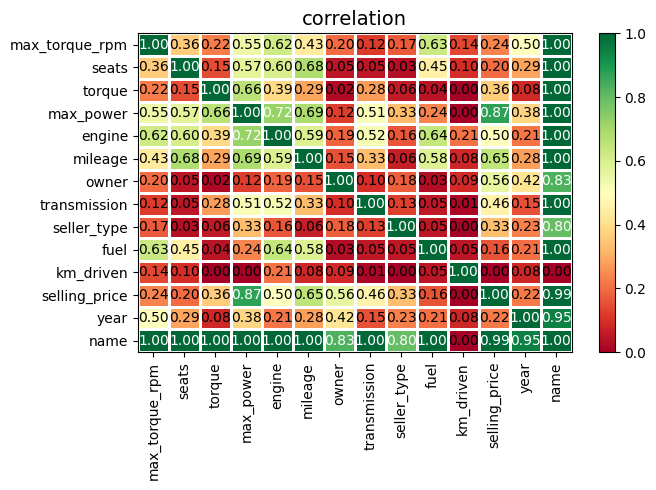

In [36]:
phik_corr = df_train.phik_matrix()

print(phik_corr)

plt.figure(figsize=(10, 8))
plot_correlation_matrix(phik_corr.values, x_labels=phik_corr.columns,
                        y_labels=phik_corr.index, vmin=0, vmax=1)
plt.show()

Phik показывает универсальную меру зависимости, захватывающую линейные, нелинейные, а также числовые и категориальные связи.

По картинке видно, что почти все признаки имеют высокую зависимость близкую к 1 с name (например, fuel-name = 1) (т.е. название модели фактически кодирует технические хар-ки). Сильные взаимосвязи между мощностными хар-ками (max_power-engine, engine-torque, mileage-engine и т.д.).

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

In [ ]:
# your code here

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [37]:
df_train.select_dtypes(include=[np.number]).columns

Index(['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power',
       'torque', 'seats', 'max_torque_rpm'],
      dtype='object')

Теперь выберем подходящие для построения модели признаки. Во-первых, удалим selling_price как целевую переменную. Во-вторых, у признаков mileage и у max_torque_rpm отсутствует корреляция с целевым признаком (она близка к нулю в трех рассмотренных типах корреляции), поэтому для нашей модели эти признаки неинформативны, можем не включать их в выборку.

In [38]:
numeric_cols = ["year", "km_driven", "engine", "max_power", "torque", "seats"]

In [39]:
y_train = df_train["selling_price"].copy()
y_test  = df_test["selling_price"].copy()

X_train = df_train[numeric_cols].copy()
X_test  = df_test[numeric_cols].copy()

In [40]:
X_train.shape, X_test.shape

((5840, 6), (1000, 6))

In [41]:
X_test.head()

,year,km_driven,engine,max_power,torque,seats
0,2010,168000,2498,112.0,260.0,7
1,2017,25000,1497,108.5,260.0,5
2,2007,218463,1799,130.0,172.0,5
3,2015,173000,1498,98.6,200.0,5
4,2011,70000,1172,65.0,96.0,5


In [ ]:
# опишите выбранные вещественные признаки

Выбранные вещественные признаки:
- year - год производства авто
- km_driven - пробег авто (в км)
- engine - объём двигателя (CC)
- max_power — мощность двигателя (bhp)
- torque — крутящий момент двигателя
- seats — количество мест в автомобиле

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [43]:
# your code here

lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

y_train_pred = lr_model.predict(X_train)
y_test_pred = lr_model.predict(X_test)

r2_train = r2_score(y_train, y_train_pred)
mse_train = MSE(y_train, y_train_pred)

r2_test = r2_score(y_test, y_test_pred)
mse_test = MSE(y_test, y_test_pred)

print(f"Train R^2: {r2_train}, Train MSE: {mse_train}")
print(f"Test R^2: {r2_test}, Test MSE: {mse_test}")

Train R^2: 0.5919051063818312, Train MSE: 116975642199.05037
Test R^2: 0.5938813830015746, Test MSE: 233448578027.0875


Линейная регрессия объясняет примерно 60% дисперсии цены автомобиля (R2 ≈ 0.59). Это говорит о наличии умеренной линейной зависимости между вещественными признаками и целевой переменной, но остаётся значительная доля вариации, которую она не объясняет.

MSE на test-датасете выше, чем на train-датасете, что указывает на увеличение ошибки на новых данных, но явного переобучения нет, поэтому модель подходит для базового анализа.



### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

`Your answer here`

R2-метрика имеет формулу = 1 - (SSres/SStot), где SSres - сумма квадратов ошибок (Residual Sum of Squares), SStot - сумма квадратов отклонений (Total Sum of Squares).

SSres - это сумма квадратов разностей между реальными значениями и предсказанными. Чем меньше эта сумма, тем точнее предсказания модели.

SStot - это мера разброса исходных данных относительно их среднего значения.

Если модель ничего не умеет, она просто предсказывает среднее, и R2=0.

In [44]:
def r2_manual(y_true, y_pred):
    ss_res = np.sum((y_true - y_pred)**2) # сумма квадратов ошибок
    ss_tot = np.sum((y_true - np.mean(y_true))**2) # общая сумма квадратов отклонений
    r2 = 1 - ss_res / ss_tot
    return r2

r2_train_manual = r2_manual(y_train.values, y_train_pred)
r2_test_manual = r2_manual(y_test.values, y_test_pred)

print(f"Train R^2: {r2_train_manual}")
print(f"Test R^2: {r2_test_manual}")

Train R^2: 0.5919051063818312
Test R^2: 0.5938813830015746


### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [ ]:
# your code here

`Your answer here`

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [45]:
# your code here
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [46]:
# your code here

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

coef_df = pd.DataFrame({
    'feature': X_train.columns,
    'coef': lr.coef_
})

coef_df['abs_coef'] = np.abs(coef_df['coef'])
coef_df.sort_values('abs_coef', ascending=False, inplace=True)

coef_df

,feature,coef,abs_coef
3,max_power,308975.751689,308975.751689
0,year,164861.341112,164861.341112
2,engine,45830.931214,45830.931214
1,km_driven,-42030.977310,42030.977310
5,seats,-29690.985768,29690.985768
4,torque,22855.319715,22855.319715


Судя по таблице коэффициентов после стандартизации, наиболее информативным признаком для предсказания цены оказался max_power — у него наибольший по модулю коэффициент βi (308975). Это значит, что изменение мощности двигателя сильнее всего влияет на прогнозируемую цену машины по сравнению с другими признаками.

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [48]:
# your code here
lasso_model = Lasso(random_state=42)
lasso_model.fit(X_train_scaled, y_train)

y_train_pred = lasso_model.predict(X_train_scaled)
y_test_pred = lasso_model.predict(X_test_scaled)

r2_train = r2_score(y_train, y_train_pred)
mse_train = MSE(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
mse_test = MSE(y_test, y_test_pred)

print(f"Train R^2: {r2_train}, Train MSE: {mse_train}")
print(f"Test R^2: {r2_test}, Test MSE: {mse_test}")

Train R^2: 0.5919051063667751, Train MSE: 116975642203.36606
Test R^2: 0.5938806844709876, Test MSE: 233448979562.4158


In [49]:
lasso_coeffs = pd.DataFrame({
    'feature': X_train.columns,
    'coef': lasso_model.coef_,
    'abs_coef': np.abs(lasso_model.coef_)
}).sort_values(by='abs_coef', ascending=False)

print(lasso_coeffs)

     feature           coef       abs_coef
3  max_power  308974.182220  308974.182220
0       year  164860.730468  164860.730468
2     engine   45833.362879   45833.362879
1  km_driven  -42030.973473   42030.973473
5      seats  -29690.904454   29690.904454
4     torque   22854.323143   22854.323143


Lasso с параметрами по умолчанию не занулила ни один из признаков (тк, судя по таблице, все коэффициенты остаются отличными от нуля). Возможно, так произошло, тк по умолчанию lasso-регуляризация использует значение гиперпараметра alpha=0.1, который задаёт силу регуляризации (т.е. если регуляризация сильная, то модель сильнее штрафует большие коэффициенты).

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [50]:
# your code here
param_grid = {
    'alpha': [0.01, 0.1, 0.5, 1.0, 5.0, 10.0],
    'max_iter': [1000, 5000]
}

lasso = Lasso(max_iter=5000)
grid_search = GridSearchCV(lasso, param_grid, cv=10, scoring='r2')
grid_search.fit(X_train, y_train)

best_lasso = grid_search.best_estimator_
print("Лучший alpha:", best_lasso.alpha)
print("Лучший max_iter:", best_lasso.max_iter)

Лучший alpha: 0.01
Лучший max_iter: 1000


Т.к. в param_grid было 6 значений alpha, а использовалось 10 фолдов, значит, обучено 6 × 10 = 60 моделей.

В param_grid я задала два параметра: alpha, который отвечает за силу L1-регуляризации в Lasso (чем больше alpha, тем сильнее сжимаются коэффициенты и тем больше признаков может занулиться), и max_iter, который задаёт максимальное число итераций для сходимости оптимизации.

Лучшая модель показала alpha = 0.01 и max_iter = 1000. Это означает очень слабую регуляризацию (коэффициенты практически не занулились, поскольку все признаки в модели достаточно значимы для предсказания цены).

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [51]:
# your code here
param_grid = {
    'alpha': [0.01, 0.1, 0.5, 1.0],
    'l1_ratio': [0.1, 0.5, 0.9, 1.0]
}

elastic_net = ElasticNet(max_iter=5000)
grid_search = GridSearchCV(elastic_net, param_grid, cv=10, scoring='r2')
grid_search.fit(X_train, y_train)

best_enet = grid_search.best_estimator_
print("Лучший alpha:", best_enet.alpha)
print("Лучший l1_ratio:", best_enet.l1_ratio)
print("Лучшее R^2:", grid_search.best_score_)

Лучший alpha: 0.01
Лучший l1_ratio: 1.0
Лучшее R^2: 0.5705844499336373


Гридсерч перебрал 4 значения параметра alpha и 4 значения l1_ratio = 16 моделей (l1 определяет, насколько сильным будет отбор признаков), каждая обучалась с 10-фолдовой кросс-валидацией, то есть фактически происходило 160 обучений моделей.

Лучшие гиперпараметры, найденные по метрике R2 на кросс-валидации: alpha = 0.01, l1_ratio = 1.0 (при этом R2 ≈ 0.570).

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



**Мой ответ:**

Результаты обучения показывают, что при использовании L0-регуляризации практически все признаки сохранили ненулевые коэффициенты, что указывает на их значимость для предсказания цены. Увеличение alpha или повышение порога зануления приводит к уменьшению числа активных признаков, ведь остаются наиболее информативные признаки, тогда как слишком маленький штраф сохраняет почти все признаки, делая модель ближе к обычной линейной регрессии.

In [69]:
# your code here

threshold_grid = [1e-3, 0.1, 0.5, 1, 5, 10, 100, 1000]

best_threshold = None
best_score = -np.inf
best_coef_l0 = None
best_intercept_l0 = None

lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
coef = lasso.coef_

print("Коэффициенты Lasso:")
print(coef)

for threshold in threshold_grid:
    coef_l0 = np.where(np.abs(coef) < threshold, 0, coef)

    intercept_l0 = y_train.mean() - X_train.dot(coef_l0).mean()

    y_pred_test = X_test.dot(coef_l0) + intercept_l0

    score = r2_score(y_test, y_pred_test)
    print(f"Threshold:{threshold}, R2_val:{score}")
    print(coef_l0)

    if score > best_score:
        best_score = score
        best_threshold = threshold
        best_coef_l0 = coef_l0
        best_intercept_l0 = intercept_l0

print("Лучший threshold:", best_threshold)
print("Лучший R2:", best_score)
print("Количество ненулевых признаков:", np.sum(best_coef_l0 != 0))
print("Коэффициенты после l0:")
print(best_coef_l0)

Коэффициенты Lasso:
[ 4.02565001e+04 -6.99746950e-01  9.43754833e+01  9.76606218e+03
  1.78780885e+02 -3.02270061e+04]
Threshold:0.001, R2_val:0.5938813546430599
[ 4.02565001e+04 -6.99746950e-01  9.43754833e+01  9.76606218e+03
  1.78780885e+02 -3.02270061e+04]
Threshold:0.1, R2_val:0.5938813546430599
[ 4.02565001e+04 -6.99746950e-01  9.43754833e+01  9.76606218e+03
  1.78780885e+02 -3.02270061e+04]
Threshold:0.5, R2_val:0.5938813546430599
[ 4.02565001e+04 -6.99746950e-01  9.43754833e+01  9.76606218e+03
  1.78780885e+02 -3.02270061e+04]
Threshold:1, R2_val:0.5814315528027382
[ 40256.50010901      0.             94.37548327   9766.06217665
    178.78088515 -30227.00607643]
Threshold:5, R2_val:0.5814315528027382
[ 40256.50010901      0.             94.37548327   9766.06217665
    178.78088515 -30227.00607643]
Threshold:10, R2_val:0.5814315528027382
[ 40256.50010901      0.             94.37548327   9766.06217665
    178.78088515 -30227.00607643]
Threshold:100, R2_val:0.5662623606393593
[ 4

Сначала модель обучается с помощью Lasso, после чего коэффициенты меньше заданного порога обнуляются, а интерсепт (свободный член) пересчитывается.

Судя по результатам, веса, полученные Lasso, оказались крупными (минимальный по модулю около 0.7 = |-6.99746950e-01|), поэтому малые пороги не зануляют ни один коэффициент. При больших же порогах удаляется самый маленький вес (и это ухудшает значение r2-метрики). В итоге лучшим оказывается порог 0.1, при котором структура модели не меняется, коэффициенты не обнуляются. Это может значить, что все признаки важны для предсказания, и попытка сделать модель более разреженной приводит к потере точности.

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [ ]:
names = list(df_train["name"].unique())
names[:15]

['Maruti Swift Dzire VDI',
 'Skoda Rapid 1.5 TDI Ambition',
 'Hyundai i20 Sportz Diesel',
 'Maruti Swift VXI BSIII',
 'Hyundai Xcent 1.2 VTVT E Plus',
 'Maruti Wagon R LXI DUO BSIII',
 'Maruti 800 DX BSII',
 'Toyota Etios VXD',
 'Ford Figo Diesel Celebration Edition',
 'Renault Duster 110PS Diesel RxL',
 'Maruti Zen LX',
 'Maruti Swift Dzire VDi',
 'Maruti Swift 1.3 VXi',
 'Maruti Wagon R LXI Minor',
 'Mahindra KUV 100 mFALCON G80 K8 5str']

Столбец name содержит марку, модель, тип топлива, объём двигателя, версию модели.

Возьмем любое длинное имя и разберем его на части, например, Renault Duster 110PS Diesel RxL.

Здесь можно выделить 1) бренд (марку машины) - Renault, 2) модель машины - Duster, 3) типа топлива - Diesel, 4) объём двигателя - 110PS, 5) версия модели (некоторые детали по её комплектации) - RxL.

In [ ]:
def parse_name(name):
    tokens = name.split()

    brand = tokens[0]
    model = tokens[1] if len(tokens) > 1 else None

    fuel = None
    for f in ["Diesel", "Petrol", "CNG", "LPG", "Electric"]:
        if f.lower() in name.lower():
            fuel = f
            break

    engine_capacity = None
    match = re.search(r"\b\d\.\d\b", name)  # ищем только числа с точкой
    if match:
        engine_capacity = match.group()

    tail_tokens = tokens[2:]  # всё после бренда и модели
    tail_tokens = [t for t in tail_tokens if t not in (fuel, engine_capacity)]

    config = None
    if len(tail_tokens) > 0:
        config = " ".join(tail_tokens)

    return pd.Series([brand, model, fuel, engine_capacity, config],
                     index=["brand", "model", "fuel", "engine_capacity", "config"])

In [ ]:
# your code here

X_train_name = df_train["name"].apply(parse_name)
X_test_name  = df_test["name"].apply(parse_name)

X_train_name.columns = ["brand", "model", "fuel", "engine_capacity", "config"]
X_test_name.columns = ["brand", "model", "fuel", "engine_capacity", "config"]

X_train_cat = pd.concat([X_train, X_train_name], axis=1)
X_test_cat = pd.concat([X_test, X_test_name], axis=1)
X_train_cat = X_train_cat.loc[:, ~X_train_cat.columns.duplicated()]
X_test_cat  = X_test_cat.loc[:, ~X_test_cat.columns.duplicated()]

In [ ]:
X_train_name.head(5)

,brand,model,fuel,engine_capacity,config
0,Maruti,Swift,None,None,Dzire VDI
1,Skoda,Rapid,None,1.5,TDI Ambition
2,Hyundai,i20,Diesel,None,Sportz
3,Maruti,Swift,None,None,VXI BSIII
4,Hyundai,Xcent,None,1.2,VTVT E Plus


In [ ]:
X_train_cat.head(5)

,year,km_driven,engine,max_power,torque,seats,brand,model,fuel,engine_capacity,config
0,2014,145500,1248,74.00,190.000000,5,Maruti,Swift,None,None,Dzire VDI
1,2014,120000,1498,103.52,250.000000,5,Skoda,Rapid,None,1.5,TDI Ambition
2,2010,127000,1396,90.00,219.668960,5,Hyundai,i20,Diesel,None,Sportz
3,2007,120000,1298,88.20,112.776475,5,Maruti,Swift,None,None,VXI BSIII
4,2017,45000,1197,81.86,113.750000,5,Hyundai,Xcent,None,1.2,VTVT E Plus


In [ ]:
X_train_cat.shape

(5840, 11)

In [ ]:
assert X_train_cat.shape == (5840, 11)

In [ ]:
X_train_cat.describe(include='object')

,brand,model,fuel,engine_capacity,config
count,5840,5840,618,1670,5816
unique,30,202,4,19,1559
top,Maruti,Swift,Diesel,1.2,Dzire VDI
freq,1804,558,460,423,91


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [ ]:
X_train_cat

,year,km_driven,engine,max_power,torque,seats,brand,model,fuel,engine_capacity,config
0,2014,145500,1248,74.00,190.000000,5,Maruti,Swift,None,None,Dzire VDI
1,2014,120000,1498,103.52,250.000000,5,Skoda,Rapid,None,1.5,TDI Ambition
2,2010,127000,1396,90.00,219.668960,5,Hyundai,i20,Diesel,None,Sportz
3,2007,120000,1298,88.20,112.776475,5,Maruti,Swift,None,None,VXI BSIII
4,2017,45000,1197,81.86,113.750000,5,Hyundai,Xcent,None,1.2,VTVT E Plus
...,...,...,...,...,...,...,...,...,...,...,...
5835,2008,191000,1086,62.10,96.100000,5,Hyundai,Santro,None,None,Xing GLS
5836,2013,50000,998,67.10,90.000000,5,Maruti,Wagon,None,None,R VXI BS IV with ABS
5837,2013,110000,1197,82.85,113.700000,5,Hyundai,i20,None,None,Magna
5838,2007,119000,1493,110.00,235.359600,5,Hyundai,Verna,None,None,CRDi SX


In [ ]:
names[:15]

['Maruti Swift Dzire VDI',
 'Skoda Rapid 1.5 TDI Ambition',
 'Hyundai i20 Sportz Diesel',
 'Maruti Swift VXI BSIII',
 'Hyundai Xcent 1.2 VTVT E Plus',
 'Maruti Wagon R LXI DUO BSIII',
 'Maruti 800 DX BSII',
 'Toyota Etios VXD',
 'Ford Figo Diesel Celebration Edition',
 'Renault Duster 110PS Diesel RxL',
 'Maruti Zen LX',
 'Maruti Swift Dzire VDi',
 'Maruti Swift 1.3 VXi',
 'Maruti Wagon R LXI Minor',
 'Mahindra KUV 100 mFALCON G80 K8 5str']

In [ ]:
X_train_cat["engine_capacity"].unique()

array([None, '1.5', '1.2', '1.3', '1.4', '1.6', '2.2', '2.5', '2.8',
       '2.0', '1.1', '1.8', '1.0', '2.4', '2.6', '3.0', '3.2', '3.6',
       '2.7', '1.9'], dtype=object)

In [ ]:
X_train_cat["fuel"].unique()

array([None, 'Diesel', 'CNG', 'Petrol', 'LPG'], dtype=object)

In [ ]:
X_train_cat["brand"].unique()

array(['Maruti', 'Skoda', 'Hyundai', 'Toyota', 'Ford', 'Renault',
       'Mahindra', 'Honda', 'Chevrolet', 'Fiat', 'Datsun', 'Tata', 'Jeep',
       'Mercedes-Benz', 'Mitsubishi', 'Audi', 'Volkswagen', 'BMW',
       'Nissan', 'Lexus', 'Jaguar', 'Land', 'MG', 'Volvo', 'Daewoo',
       'Kia', 'Force', 'Ambassador', 'Isuzu', 'Peugeot'], dtype=object)

In [ ]:
X_train_cat[["brand", "model"]].drop_duplicates()

,brand,model
0,Maruti,Swift
1,Skoda,Rapid
2,Hyundai,i20
4,Hyundai,Xcent
5,Maruti,Wagon
...,...,...
5581,Hyundai,Venue
5627,Renault,Scala
5672,Ambassador,Grand
5697,Volvo,S90


In [ ]:
# your code here

cat_cols = ["brand", "model", "fuel", "config", "seats"]

for c in cat_cols:
    X_train_cat[c] = X_train_cat[c].astype(str)
    X_test_cat[c] = X_test_cat[c].astype(str)

ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop='first')

X_train_ohe = ohe.fit_transform(X_train_cat[cat_cols])
X_test_ohe  = ohe.transform(X_test_cat[cat_cols])

X_train_ohe_df = pd.DataFrame(X_train_ohe, columns=ohe.get_feature_names_out(cat_cols), index=X_train_cat.index)
X_test_ohe_df  = pd.DataFrame(X_test_ohe, columns=ohe.get_feature_names_out(cat_cols), index=X_test_cat.index)

numeric_cols = [c for c in X_train_cat.columns if c not in cat_cols]

X_train_final = pd.concat([X_train_cat[numeric_cols], X_train_ohe_df], axis=1)
X_test_final  = pd.concat([X_test_cat[numeric_cols], X_test_ohe_df], axis=1)

print(X_train_final.shape)
print(X_test_final.shape)

/usr/local/lib/python3.12/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0, 1, 3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


(5840, 1807)
(1000, 1807)


In [ ]:
X_train_final

,year,km_driven,engine,max_power,torque,engine_capacity,brand_Audi,brand_BMW,brand_Chevrolet,brand_Daewoo,...,config_xDrive20d,config_xDrive30d,seats_14,seats_2,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9
0,2014,145500,1248,74.00,190.000000,None,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,2014,120000,1498,103.52,250.000000,1.5,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,2010,127000,1396,90.00,219.668960,None,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,2007,120000,1298,88.20,112.776475,None,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,2017,45000,1197,81.86,113.750000,1.2,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,2008,191000,1086,62.10,96.100000,None,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5836,2013,50000,998,67.10,90.000000,None,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5837,2013,110000,1197,82.85,113.700000,None,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5838,2007,119000,1493,110.00,235.359600,None,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

`Your answer here`

**Как корректно работать с OHE преобразованием?**

Нужно обучать OHE только на тренировочном наборе и потом использовать transform на тестовом. Иначе в тестовом могут появиться новые категории — для них указываем handle_unknown='ignore'.

**Почему мы удаляем один столбец?**

Если у нас есть категориальный признак с 3 значениями [A, B, C], OHE создаст три бинарных столбца. Но проблема в том, что эти столбцы линейно зависимы (A + B + C = 1). Если использовать все три, линейная модель (или любая модель с линейной зависимостью признаков) столкнется с мультиколлинеарностью. Поэтому удаляем один столбец (drop='first'), а оставшиеся столбцы однозначно кодируют категорию.

**Пусть из  𝑛  признаков мы получили  𝑛−1  столбец, из которых  𝑘<𝑛−1  оказались не важными по весам модели. Корректно ли их удалить?**

Удалять можно, если модель не потеряет информацию. Если столбцы OHE одного исходного признака полностью удаляются, мы можем упустить категориальную информацию. Лучше удалять только отдельные бинарные столбцы, а не весь признак (вообще лучше проверять качество модели после удаления).

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [ ]:
# your code here

X_train_num = X_train_final.select_dtypes(include=[np.number])
X_test_num  = X_test_final.select_dtypes(include=[np.number])

y_train_num = y_train
y_test_num  = y_test

param_grid = {'alpha': [0.01, 0.1, 1, 10, 50, 100, 200]}

ridge = Ridge()

grid = GridSearchCV(ridge, param_grid, scoring='r2', cv=10, n_jobs=-1)
grid.fit(X_train_num, y_train_num)

print("Лучший параметр alpha:", grid.best_params_)
print("Лучший R^2:", grid.best_score_)

best_ridge = grid.best_estimator_
r2_test = best_ridge.score(X_test_num, y_test_num)
print("R^2 на тесте:", r2_test)

Лучший параметр alpha: {'alpha': 1}
Лучший R^2: 0.8027996063123964
R^2 на тесте: 0.9446133841350123


**Удалось ли улучшить качество прогнозов?**

Скор R2-метрики значительно улучшился со сравнению с предыдущим значением (около 0.59 и на train, и на test). Кажется, что регуляризация в Ridge помогла модели лучше обобщать данные и повысила стабильность прогнозов.

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [ ]:
# your code here

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [ ]:
def business_metrics(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    within_10_percent = np.abs(y_pred - y_true) <= 0.10 * y_true
    return np.mean(within_10_percent)

y_train_pred = best_ridge.predict(X_train_num)
y_test_pred  = best_ridge.predict(X_test_num)

train_score = business_metrics(y_train_num, y_train_pred)
test_score  = business_metrics(y_test_num, y_test_pred)

print(f"(RIDGE) Бизнес-метрика на трейне: {train_score}")
print(f"(RIDGE) Бизнес-метрика на тесте: {test_score}")

(RIDGE) Бизнес-метрика на трейне: 0.45273972602739726
(RIDGE) Бизнес-метрика на тесте: 0.4


In [ ]:
y_train_pred = lr_model.predict(X_train)
y_test_pred = lr_model.predict(X_test)

train_score = business_metrics(y_train_num, y_train_pred)
test_score  = business_metrics(y_test_num, y_test_pred)

print(f"(LinearRegression) Бизнес-метрика на трейне: {train_score}")
print(f"(LinearRegression) Бизнес-метрика на тесте: {test_score}")

(LinearRegression) Бизнес-метрика на трейне: 0.20667808219178083
(LinearRegression) Бизнес-метрика на тесте: 0.209


In [ ]:
y_train_pred = best_lasso.predict(X_train)
y_test_pred  = best_lasso.predict(X_test)

train_score = business_metrics(y_train, y_train_pred)
test_score  = business_metrics(y_test, y_test_pred)

print(f"(LASSO) Бизнес-метрика на трейне: {train_score}")
print(f"(LASSO) Бизнес-метрика на тесте: {test_score}")

(LASSO) Бизнес-метрика на трейне: 0.20667808219178083
(LASSO) Бизнес-метрика на тесте: 0.209


In [ ]:
y_train_pred = best_enet.predict(X_train)
y_test_pred  = best_enet.predict(X_test)

train_score = business_metrics(y_train, y_train_pred)
test_score  = business_metrics(y_test, y_test_pred)

print(f"(ElasticNet) Бизнес-метрика на трейне: {train_score}")
print(f"(ElasticNet) Бизнес-метрика на тесте: {test_score}")

(ElasticNet) Бизнес-метрика на трейне: 0.20667808219178083
(ElasticNet) Бизнес-метрика на тесте: 0.209


Несмотря на высокое значение R², бизнес-метрика Ridge-подхода показывает, что только 40–45% предсказаний попадают в диапазон ±10% от реальной цены, что может быть недостаточно точным для принятия решений в бизнесе.

Однако сравнение бизнес-метрики для всех моделей показывает, что Ridge значительно превосходит остальные методы. В то время как LinearRegression, Lasso и ElasticNet демонстрируют примерно одинаковый, но гораздо более низкий результат — около 0.21 на трейне и тесте, что говорит о том, что эти модели плохо справляются с задачей точного прогнозирования цен для бизнеса (НО стоит учитывать, что эти модели обучались на разных данных - т.е. в некоторых моделях список столбцов с признаками отличался).

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



**Мой ответ:**

Можно реализовать асимметричную бизнес-метрику, где недопрогноз (когда предсказанная цена меньше реальной) штрафуется сильнее, чем перепрогноз. Например, считаем долю предсказаний, которые не недооценивают цену больше чем на 10%, при этом перепрогноз до 10% допускаем.

In [ ]:
def your_business_metrics(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    diff = y_pred - y_true

    # true если предсказание не недооценило цену более чем на 10%
    within_limit = diff >= -0.10 * y_true

    return np.mean(within_limit)

In [ ]:
y_train_pred = best_ridge.predict(X_train_num)
y_test_pred  = best_ridge.predict(X_test_num)
print("(RIDGE) Кастомная бизнес-метрика на трейне:", your_business_metrics(y_train_num, y_train_pred))
print("(RIDGE) Кастомная бизнес-метрика на тесте:", your_business_metrics(y_test_num, y_test_pred))

y_train_pred = lr_model.predict(X_train)
y_test_pred = lr_model.predict(X_test)
print("(LinearRegression) Кастомная бизнес-метрика на трейне:", your_business_metrics(y_train_num, y_train_pred))
print("(LinearRegression) Кастомная бизнес-метрика на тесте:", your_business_metrics(y_test_num, y_test_pred))

y_train_pred = best_lasso.predict(X_train)
y_test_pred  = best_lasso.predict(X_test)
print("(LASSO) Кастомная бизнес-метрика на трейне:", your_business_metrics(y_train_num, y_train_pred))
print("(LASSO) Кастомная бизнес-метрика на тесте:", your_business_metrics(y_test_num, y_test_pred))

y_train_pred = best_enet.predict(X_train)
y_test_pred  = best_enet.predict(X_test)
print("(ElasticNet) Кастомная бизнес-метрика на трейне:", your_business_metrics(y_train_num, y_train_pred))
print("(ElasticNet) Кастомная бизнес-метрика на тесте:", your_business_metrics(y_test_num, y_test_pred))

(RIDGE) Кастомная бизнес-метрика на трейне: 0.7566780821917808
(RIDGE) Кастомная бизнес-метрика на тесте: 0.724
(LinearRegression) Кастомная бизнес-метрика на трейне: 0.6414383561643836
(LinearRegression) Кастомная бизнес-метрика на тесте: 0.644
(LASSO) Кастомная бизнес-метрика на трейне: 0.6414383561643836
(LASSO) Кастомная бизнес-метрика на тесте: 0.644
(ElasticNet) Кастомная бизнес-метрика на трейне: 0.6414383561643836
(ElasticNet) Кастомная бизнес-метрика на тесте: 0.644


Моддель Ridge всё ещё показывает лучшие результаты (0.757 на трейне и 0.724 на тесте), следовательно, лучше справляется с задачей прогнозирования цен, тогда как все остальные модели (LinearRegression, Lasso и ElasticNet) имеют одинаковую, значительно более низкую метрику около 0.644 на тесте.

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**И ссылку на приложение в StreamlitHub.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.


In [ ]:
# сохраним в pickle лучшую модель

import pickle
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

cat_cols = ["brand", "model", "fuel", "config", "seats"]

categorical_transformer = OneHotEncoder(handle_unknown='ignore', drop='first', sparse_output=False)

preprocessor = ColumnTransformer([
    ('cat', categorical_transformer, cat_cols)
])

model_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', best_ridge)
])

model_pipeline.fit(X_train_cat, y_train)

with open('ridge_pipeline.pickle', 'wb') as f:
    pickle.dump(model_pipeline, f)